In [48]:
import numpy as np
import scipy
import sklearn

print("NumPy version:", np.__version__)
print("SciPy version:", scipy.__version__)
print("scikit-learn version:", sklearn.__version__)


NumPy version: 1.24.3
SciPy version: 1.7.3
scikit-learn version: 1.2.2



## Data processing:
* There are paintings of 50 artists in the dataset. However only 11 artists have more than 200 paintings available here.
* For better training and computation ,paintings of 11 artists have been used
* Due to imbalanced datset weights have been used accordingly
* Data augmentation has been implemented for better training.

## Modelling and Training:
* We Use convolutional neural network based approach, with a pre-defined architecture as baseline.
* Resnet50 has been used with pretrained weights on `imagenet`.
* This model identify artist and not objects in the images.

## Predictions:
* The final model could identify the artists with an approximate accuracy of 91% on training set and 74% on cross-validation set.

##..

In [49]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import json
import os
from tqdm import tqdm, tqdm_notebook
import random

import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.applications import *
from tensorflow.keras.callbacks import *
from tensorflow.keras.initializers import *
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Set random seeds for reproducibility
np.random.seed(1)
tf.random.set_seed(1)



In [50]:
print(os.listdir("/kaggle/input/best-artworks-of-all-time"))

['artists.csv', 'resized', 'images']


In [51]:
artists = pd.read_csv('/kaggle/input/best-artworks-of-all-time/artists.csv')
artists.shape

(50, 8)

In [52]:
# Sort artists by number of paintings
artists = artists.sort_values(by=['paintings'], ascending=False)

# Create a dataframe with artists having more than 200 paintings
artists_top = artists[artists['paintings'] >= 200].reset_index()
artists_top = artists_top[['name', 'paintings']]
#artists_top['class_weight'] = max(artists_top.paintings)/artists_top.paintings
artists_top['class_weight'] = artists_top.paintings.sum() / (artists_top.shape[0] * artists_top.paintings)
artists_top

,name,paintings,class_weight
0,Vincent van Gogh,877,0.445631
1,Edgar Degas,702,0.556721
2,Pablo Picasso,439,0.890246
3,Pierre-Auguste Renoir,336,1.163149
4,Albrecht Dürer,328,1.191519
5,Paul Gauguin,311,1.256650
6,Francisco Goya,291,1.343018
7,Rembrandt,262,1.491672
8,Alfred Sisley,259,1.508951
9,Titian,255,1.532620


In [53]:
# Set class weights - assign higher weights to underrepresented classes
class_weights = artists_top['class_weight'].to_dict()
class_weights

{0: 0.44563076604125634,
 1: 0.5567210567210568,
 2: 0.8902464278318493,
 3: 1.1631493506493507,
 4: 1.1915188470066518,
 5: 1.2566501023092662,
 6: 1.3430178069353327,
 7: 1.491672449687717,
 8: 1.5089505089505089,
 9: 1.532620320855615,
 10: 1.6352225180677062}

In [54]:
# There is some problem recognizing 'Albrecht_Dürer' (don't know why, worth exploring)
# So I'll update this string as directory name to df's
updated_name = "Albrecht_Dürer".replace("_", " ")
artists_top.iloc[4, 0] = updated_name

In [55]:

# Explore images of top artists
images_dir = '/kaggle/input/dashtoonn/dashtoon/train'
artists_dirs = os.listdir(images_dir)
artists_top_name = artists_top['name'].str.replace(' ', '_').values

# See if all directories exist
for name in artists_top_name:
    if os.path.exists(os.path.join(images_dir, name)):
        print("Found -->", os.path.join(images_dir, name))
    else:
        print("Did not find -->", os.path.join(images_dir, name))

Found --> /kaggle/input/dashtoonn/dashtoon/train/Vincent_van_Gogh
Found --> /kaggle/input/dashtoonn/dashtoon/train/Edgar_Degas
Found --> /kaggle/input/dashtoonn/dashtoon/train/Pablo_Picasso
Found --> /kaggle/input/dashtoonn/dashtoon/train/Pierre-Auguste_Renoir
Found --> /kaggle/input/dashtoonn/dashtoon/train/Albrecht_Dürer
Found --> /kaggle/input/dashtoonn/dashtoon/train/Paul_Gauguin
Found --> /kaggle/input/dashtoonn/dashtoon/train/Francisco_Goya
Found --> /kaggle/input/dashtoonn/dashtoon/train/Rembrandt
Found --> /kaggle/input/dashtoonn/dashtoon/train/Alfred_Sisley
Found --> /kaggle/input/dashtoonn/dashtoon/train/Titian
Found --> /kaggle/input/dashtoonn/dashtoon/train/Marc_Chagall


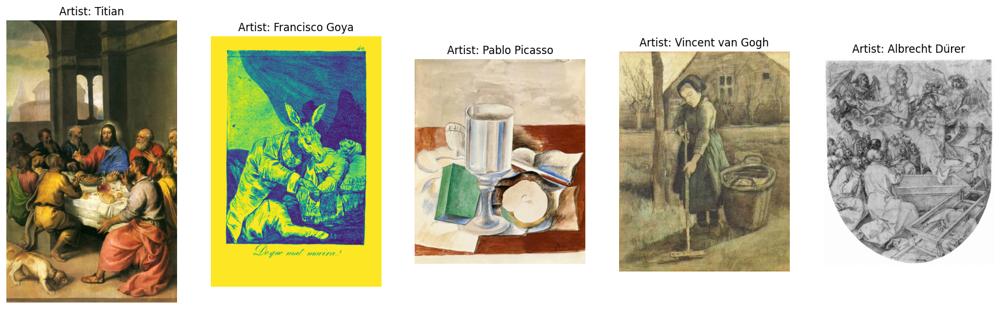

In [56]:
# Print few random paintings
n = 5
fig, axes = plt.subplots(1, n, figsize=(20,10))

for i in range(n):
    random_artist = random.choice(artists_top_name)
    random_image = random.choice(os.listdir(os.path.join(images_dir, random_artist)))
    random_image_file = os.path.join(images_dir, random_artist, random_image)
    image = plt.imread(random_image_file)
    axes[i].imshow(image)
    axes[i].set_title("Artist: " + random_artist.replace('_', ' '))
    axes[i].axis('off')

plt.show()

In [57]:
# Set parameters for data generators and model
batch_size = 16
train_input_shape = (224, 224, 3)
n_classes = artists_top.shape[0]
images_dir = '/kaggle/input/dashtoonn/dashtoon/train'

# Create an ImageDataGenerator for training data with data augmentation
train_datagen = ImageDataGenerator(validation_split=0.2,
                                   rescale=1./255.,
                                   shear_range=5,
                                   horizontal_flip=True,
                                   vertical_flip=True,
                                  )

# Training data generator
train_generator = train_datagen.flow_from_directory(directory=images_dir,
                                                    class_mode='categorical',
                                                    target_size=train_input_shape[0:2],
                                                    batch_size=batch_size,
                                                    subset="training",
                                                    shuffle=True,
                                                    classes=artists_top_name.tolist()
                                                   )

# Validation data generator
valid_generator = train_datagen.flow_from_directory(directory=images_dir,
                                                    class_mode='categorical',
                                                    target_size=train_input_shape[0:2],
                                                    batch_size=batch_size,
                                                    subset="validation",
                                                    shuffle=True,
                                                    classes=artists_top_name.tolist()
                                                   )

# Create a separate ImageDataGenerator for test data without data augmentation
test_datagen = ImageDataGenerator(rescale=1./255.)
test_images_dir = '/kaggle/input/dashtoonn/dashtoon/test'
test_generator = test_datagen.flow_from_directory(directory=test_images_dir,
                                                  class_mode='categorical',
                                                  target_size=train_input_shape[0:2],
                                                  batch_size=batch_size,
                                                  shuffle=False,  # No need to shuffle test data
                                                  classes=artists_top_name.tolist()
                                                 )

# Calculate step sizes for training, validation, and test data
STEP_SIZE_TRAIN = train_generator.n // train_generator.batch_size
STEP_SIZE_VALID = valid_generator.n // valid_generator.batch_size
STEP_SIZE_TEST = test_generator.n // test_generator.batch_size

# Print the total number of batches for training, validation, and testing
print("Total number of batches for training =", STEP_SIZE_TRAIN)
print("Total number of batches for validation =", STEP_SIZE_VALID)
print("Total number of batches for testing =", STEP_SIZE_TEST)


Found 3422 images belonging to 11 classes.
Found 849 images belonging to 11 classes.
Found 28 images belonging to 11 classes.
Total number of batches for training = 213
Total number of batches for validation = 53
Total number of batches for testing = 1


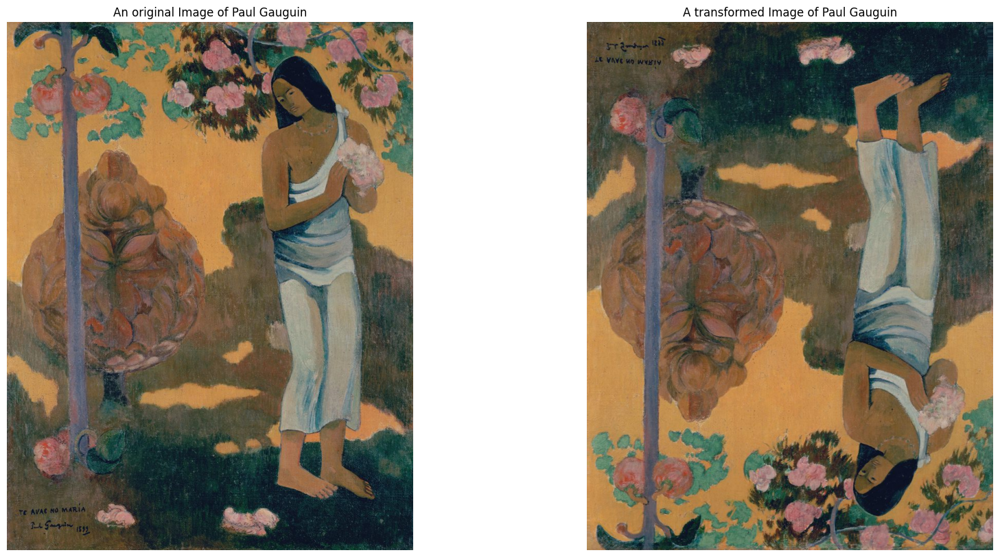

In [14]:
# Print a random paintings and it's random augmented version
fig, axes = plt.subplots(1, 2, figsize=(20,10))

random_artist = random.choice(artists_top_name)
random_image = random.choice(os.listdir(os.path.join(images_dir, random_artist)))
random_image_file = os.path.join(images_dir, random_artist, random_image)

# Original image
image = plt.imread(random_image_file)
axes[0].imshow(image)
axes[0].set_title("An original Image of " + random_artist.replace('_', ' '))
axes[0].axis('off')

# Transformed image
aug_image = train_datagen.random_transform(image)
axes[1].imshow(aug_image)
axes[1].set_title("A transformed Image of " + random_artist.replace('_', ' '))
axes[1].axis('off')

plt.show()

In [58]:
# Load pre-trained model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=train_input_shape)

for layer in base_model.layers:
    layer.trainable = True

94765736/94765736 [==============================] - 0s 0us/step


In [59]:
# Add layers to the end of the base model
X = base_model.output
X = Flatten()(X)  # Flatten the output of the base model

# Add a fully connected layer with 512 units, using He uniform initialization
X = Dense(512, kernel_initializer='he_uniform')(X)
# X = Dropout(0.5)(X)  
X = BatchNormalization()(X)  # Batch normalization for stability
X = Activation('relu')(X)  # ReLU activation function

# Add another fully connected layer with 16 units, using He uniform initialization
X = Dense(16, kernel_initializer='he_uniform')(X)
# X = Dropout(0.5)(X)  
X = BatchNormalization()(X)  # Batch normalization for stability
X = Activation('relu')(X)  # ReLU activation function

# Output layer with softmax activation for multiclass classification
output = Dense(n_classes, activation='softmax')(X)

# Create a new model with the added layers on top of the base model
model = Model(inputs=base_model.input, outputs=output)


In [60]:
optimizer = Adam(lr=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer, 
              metrics=['accuracy'])
n_epoch = 10

early_stop = EarlyStopping(monitor='val_loss', patience=20, verbose=1, 
                           mode='auto', restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, 
                              verbose=1, mode='auto')

In [61]:
# Train the model - all layers
history1 = model.fit_generator(generator=train_generator, steps_per_epoch=STEP_SIZE_TRAIN,
                              validation_data=valid_generator, validation_steps=STEP_SIZE_VALID,
                              epochs=n_epoch,
                              shuffle=True,
                              verbose=1,
                              callbacks=[reduce_lr],
                              use_multiprocessing=True,
                              workers=16,
                              class_weight=class_weights
                             )

/tmp/ipykernel_47/4005977698.py:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history1 = model.fit_generator(generator=train_generator, steps_per_epoch=STEP_SIZE_TRAIN,


Epoch 1/10
213/213 [==============================] - 111s 300ms/step - loss: 1.8440 - accuracy: 0.3673 - val_loss: 5.4064 - val_accuracy: 0.0613 - lr: 0.0010
Epoch 2/10
213/213 [==============================] - 63s 280ms/step - loss: 1.5855 - accuracy: 0.4548 - val_loss: 3.0593 - val_accuracy: 0.0590 - lr: 0.0010
Epoch 3/10
213/213 [==============================] - 68s 305ms/step - loss: 1.3752 - accuracy: 0.5208 - val_loss: 3.3179 - val_accuracy: 0.0613 - lr: 0.0010
Epoch 4/10
213/213 [==============================] - 67s 304ms/step - loss: 1.2703 - accuracy: 0.5573 - val_loss: 2.9814 - val_accuracy: 0.1474 - lr: 0.0010
Epoch 5/10
213/213 [==============================] - 63s 281ms/step - loss: 1.1817 - accuracy: 0.5816 - val_loss: 1.7705 - val_accuracy: 0.4446 - lr: 0.0010
Epoch 6/10
213/213 [==============================] - 63s 284ms/step - loss: 1.0929 - accuracy: 0.6031 - val_loss: 2.3073 - val_accuracy: 0.3750 - lr: 0.0010
Epoch 7/10
213/213 [==============================]

In [62]:
# Freeze all layers in the model
for layer in model.layers:
    layer.trainable = False

# Unfreeze the first 50 layers for fine-tuning
for layer in model.layers[:50]:
    layer.trainable = True

# Define the optimizer with a specified learning rate
optimizer = Adam(lr=0.0001)

# Compile the model with categorical crossentropy loss and the specified optimizer
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer, 
              metrics=['accuracy'])

# Set the number of training epochs
n_epoch = 50

# Train the model using a generator for both training and validation data
history2 = model.fit_generator(generator=train_generator, steps_per_epoch=STEP_SIZE_TRAIN,
                              validation_data=valid_generator, validation_steps=STEP_SIZE_VALID,
                              epochs=n_epoch,
                              shuffle=True,
                              verbose=1,
                              # Include callbacks for learning rate reduction and early stopping
                              callbacks=[reduce_lr, early_stop],
                              # Enable multiprocessing and specify the number of workers
                              use_multiprocessing=True,
                              workers=16,
                              # Pass class weights if needed for imbalanced classes
                              class_weight=class_weights)


/tmp/ipykernel_47/2442743920.py:15: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history2 = model.fit_generator(generator=train_generator, steps_per_epoch=STEP_SIZE_TRAIN,


Epoch 1/50
213/213 [==============================] - 72s 262ms/step - loss: 0.6558 - accuracy: 0.7363 - val_loss: 1.4687 - val_accuracy: 0.5012 - lr: 0.0010
Epoch 2/50
213/213 [==============================] - 57s 255ms/step - loss: 0.5616 - accuracy: 0.7742 - val_loss: 1.5232 - val_accuracy: 0.5035 - lr: 0.0010
Epoch 3/50
213/213 [==============================] - 57s 256ms/step - loss: 0.5657 - accuracy: 0.7710 - val_loss: 1.5790 - val_accuracy: 0.5000 - lr: 0.0010
Epoch 4/50
213/213 [==============================] - 57s 255ms/step - loss: 0.5289 - accuracy: 0.7860 - val_loss: 1.2638 - val_accuracy: 0.6038 - lr: 0.0010
Epoch 5/50
213/213 [==============================] - 58s 258ms/step - loss: 0.5270 - accuracy: 0.7945 - val_loss: 1.2945 - val_accuracy: 0.5920 - lr: 0.0010
Epoch 6/50
213/213 [==============================] - 57s 251ms/step - loss: 0.5144 - accuracy: 0.7951 - val_loss: 1.4965 - val_accuracy: 0.5271 - lr: 0.0010
Epoch 7/50
213/213 [==============================] 

In [63]:
model.save('/kaggle/working/artistclassify.keras')
from tensorflow.keras.models import load_model
model = load_model('/kaggle/working/artistclassify.keras')

In [64]:
# Merge history1 and history2
history = {}
history['loss'] = history1.history['loss'] + history2.history['loss']
history['acc'] = history1.history['accuracy'] + history2.history['accuracy']
history['val_loss'] = history1.history['val_loss'] + history2.history['val_loss']
history['val_acc'] = history1.history['val_accuracy'] + history2.history['val_accuracy']
history['lr'] = history1.history['lr'] + history2.history['lr']

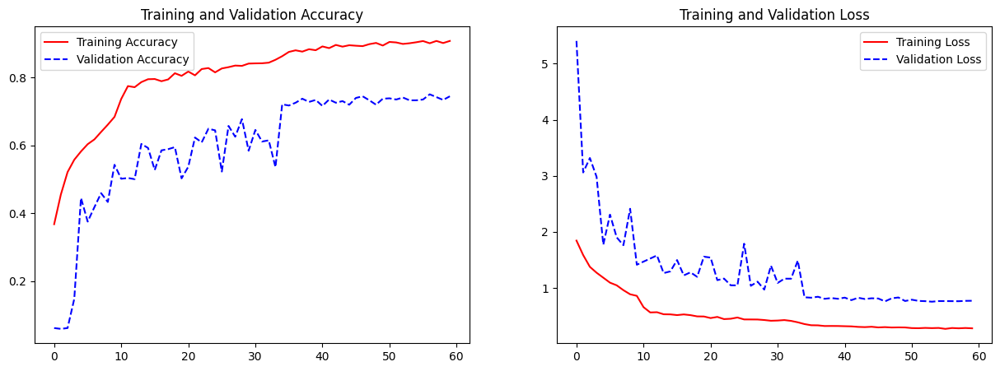

In [65]:
# Plot the training graph
def plot_training(history):
    acc = history['acc']
    val_acc = history['val_acc']
    loss = history['loss']
    val_loss = history['val_loss']
    epochs = range(len(acc))

    fig, axes = plt.subplots(1, 2, figsize=(15,5))
    
    axes[0].plot(epochs, acc, 'r-', label='Training Accuracy')
    axes[0].plot(epochs, val_acc, 'b--', label='Validation Accuracy')
    axes[0].set_title('Training and Validation Accuracy')
    axes[0].legend(loc='best')

    axes[1].plot(epochs, loss, 'r-', label='Training Loss')
    axes[1].plot(epochs, val_loss, 'b--', label='Validation Loss')
    axes[1].set_title('Training and Validation Loss')
    axes[1].legend(loc='best')
    
    plt.show()
    
plot_training(history)

In [66]:
# Prediction accuracy on train data
score = model.evaluate_generator(train_generator, verbose=1)
print("Prediction accuracy on train data =", score[1])

/tmp/ipykernel_47/4076090939.py:2: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  score = model.evaluate_generator(train_generator, verbose=1)


214/214 [==============================] - 72s 325ms/step - loss: 0.3122 - accuracy: 0.9196
Prediction accuracy on train data = 0.9196376204490662


In [67]:
# Prediction accuracy on CV data
score = model.evaluate_generator(valid_generator, verbose=1)
print("Prediction accuracy on CV data =", score[1])

/tmp/ipykernel_47/2117339602.py:2: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  score = model.evaluate_generator(valid_generator, verbose=1)


54/54 [==============================] - 18s 337ms/step - loss: 0.7553 - accuracy: 0.7444
Prediction accuracy on CV data = 0.744405210018158


1/1 [==============================] - 0s 29ms/step


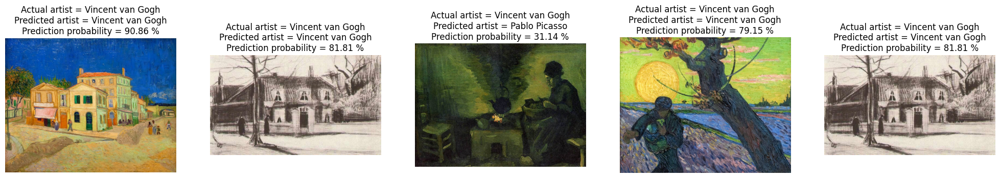

In [68]:
from keras.preprocessing import image
import matplotlib.pyplot as plt
import os
import numpy as np
import random

test_directory = "/kaggle/input/vincentt/testt"  # Replace with the path to your test directory

n = 5
fig, axes = plt.subplots(1, n, figsize=(25, 10))

for i in range(n):
    # Select a random class (artist) from the test directory
    random_artist = random.choice(os.listdir(test_directory))
    
    # Select a random image from the selected artist
    random_image = random.choice(os.listdir(os.path.join(test_directory, random_artist)))
    random_image_file = os.path.join(test_directory, random_artist, random_image)

    # Original image
    test_image = image.load_img(random_image_file, target_size=(train_input_shape[0], train_input_shape[1]))

    # Predict artist
    test_image = image.img_to_array(test_image)
    test_image /= 255.
    test_image = np.expand_dims(test_image, axis=0)

    prediction = model.predict(test_image)
    prediction_probability = np.amax(prediction)
    prediction_idx = np.argmax(prediction)

    labels = train_generator.class_indices
    labels = dict((v, k) for k, v in labels.items())

    title = "Actual artist = {}\nPredicted artist = {}\nPrediction probability = {:.2f} %" \
            .format(random_artist.replace('_', ' '), labels[prediction_idx].replace('_', ' '),
                    prediction_probability * 100)

    # Print image
    axes[i].imshow(plt.imread(random_image_file))
    axes[i].set_title(title)
    axes[i].axis('off')

plt.show()


##-------------------------------------------------------------------------------


## STYLE TRANSFER IMPLEMENTATION:
I realised the task was not to classify artists ; rather train the model on one artist and use the particular artist style for style transfer on
user input images

We use vgg19 as the model here and train the model on one specific artist.
"Vincent can gogh" was chosen becuase of the maximum number of images for this artist 



## Modelling and Training:
* We Use VGG19 MODEL with a pre-defined architecture as baseline
* The model is trained on 'Vincent can gogh' painting images and the weights are then utilised for the style transfer
* The VGG19 model with pretrained weights of the artist is used for the neural style transfer

## Output:
* The final ouput takes base image , a stylize image and then outputs the stylized image

##..
##..


# PYTORCH IMPLEMENTATION

for style transfer

In [2]:
images_dir1='/kaggle/input/vincentt/trainn'
test_images_dir1='/kaggle/input/vincentt/testt'

## dataloader for van gogh images

In [16]:
import torch
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from torchvision.datasets import ImageFolder

# Define the transformations for training and validation
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

valid_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Define a custom dataset class
class CustomDataset(Dataset):
    def __init__(self, data_dir, transform=None, split='train'):
        # Create an ImageFolder dataset using the specified directory and transformation
        self.data = ImageFolder(root=data_dir, transform=transform)
        self.classes = self.data.classes  # Get the classes from the ImageFolder dataset
        self.split = split
        self.transform = transform

    def __getitem__(self, index):
        # Retrieve an image and its label from the ImageFolder dataset
        image, label = self.data[index]
        return image, label

    def __len__(self):
        # Get the total number of samples in the ImageFolder dataset
        return len(self.data)

# Create instances of the custom dataset for training and validation
train_dataset = CustomDataset(data_dir=images_dir1, transform=train_transform, split='train')
valid_dataset = CustomDataset(data_dir=images_dir1, transform=valid_transform, split='valid')

# Create data loaders for training and validation
batch_size = 16
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# Define transformations for the test dataset
test_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Create an instance of the custom dataset for testing
test_dataset = CustomDataset(data_dir=test_images_dir1, transform=test_transform, split='test')
# Create a data loader for testing
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)


## vgg19 model to train it on the chosen artist data

In [19]:
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models

class CustomVGG19Regression(nn.Module):
    def __init__(self):
        super(CustomVGG19Regression, self).__init__()
        
        # Load pre-trained VGG19 model from torchvision
        self.base_model = models.vgg19(pretrained=True)
        
        # Remove fully connected layers at the end
        self.features = self.base_model.features
        
        # Add custom fully connected layers for regression
        self.regression_layers = nn.Sequential(
            nn.Flatten(),  # Flatten the output for the fully connected layers
            nn.Linear(512 * 7 * 7, 512),  # Fully connected layer with 512 units
            nn.BatchNorm1d(512),  # Batch normalization for stability
            nn.ReLU(),  # ReLU activation function
            nn.Linear(512, 16),  # Fully connected layer with 16 units
            nn.BatchNorm1d(16),  # Batch normalization for stability
            nn.ReLU(),  # ReLU activation function
            nn.Linear(16, 1),  # Adjust the output size based on the number of regression targets
            nn.Identity()  # No activation for regression
        )

    def forward(self, x):
        # Forward pass through the VGG19 feature extraction layers
        x = self.features(x)
        
        # Forward pass through the custom regression layers
        x = self.regression_layers(x)
        return x

# Create an instance of the CustomVGG19Regression model
model_pytorch_regression = CustomVGG19Regression()


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Assuming CustomVGG19Regression is the modified regression model
model_pytorch = CustomVGG19Regression()

# Define the loss function and optimizer
criterion = nn.MSELoss()  # Mean Squared Error Loss for regression
optimizer = optim.Adam(model_pytorch.parameters(), lr=0.0001)

# Define the learning rate scheduler
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)

# Training loop
n_epoch = 50
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_pytorch.to(device)
criterion.to(device)

for epoch in range(n_epoch):
    model_pytorch.train()
    running_loss = 0.0

    for inputs, _ in train_loader:  # Ignore labels for regression
        inputs = inputs.to(device)

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model_pytorch(inputs)

        # For regression, you need ground truth values (labels)
        # In this example, assuming a dummy target of zeros
        labels = torch.zeros_like(outputs, requires_grad=False).to(device)

        # Compute the loss
        loss = criterion(outputs, labels)

        # Backward pass and optimization
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    # Validation
    model_pytorch.eval()
    val_loss = 0.0

    with torch.no_grad():
        for inputs, _ in valid_loader:
            inputs = inputs.to(device)

            # Forward pass
            outputs = model_pytorch(inputs)

            # Dummy target for validation
            labels = torch.zeros_like(outputs, requires_grad=False).to(device)

            # Compute the loss
            loss = criterion(outputs, labels)

            val_loss += loss.item()

    # Update learning rate and print statistics
    scheduler.step(val_loss)

    print(f'Epoch {epoch+1}/{n_epoch}, Loss: {running_loss/len(train_loader):.4f}, Val Loss: {val_loss/len(valid_loader):.4f}')

# Test the model
model_pytorch.eval()
all_predictions = []
all_true_labels = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)

        # Forward pass
        outputs = model_pytorch(inputs)

        all_predictions.extend(outputs.cpu().numpy())
        all_true_labels.extend(labels.cpu().numpy())

# Convert ground truth labels to numpy array if not already done
all_true_labels = np.array(all_true_labels)

# Evaluate your regression predictions
mse = mean_squared_error(all_true_labels, all_predictions)
mae = mean_absolute_error(all_true_labels, all_predictions)
r2 = r2_score(all_true_labels, all_predictions)
rmse = np.sqrt(mse)

print(f'Mean Squared Error: {mse:.4f}')
print(f'Mean Absolute Error: {mae:.4f}')
print(f'R-squared: {r2:.4f}')
print(f'Root Mean Squared Error: {rmse:.4f}')


## save the model

In [21]:
# Save the trained model
torch.save(model_pytorch.state_dict(), '/kaggle/working/custom_vgg19_model.pth')

## NEURAL STYLE TRANSFER
NOWE HAVE THE VGG19 MODEL TRAINED ON ARTIST IMAGES WE USE THE WEIGHTS FOR STYLE TRANSFER

In [23]:
# import resources
%matplotlib inline
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.optim as optim
from torchvision import transforms, models

In [117]:
import random
import os

artist = 'Vincent_van_Gogh'
random_image1 = random.choice(os.listdir(os.path.join(images_dir, artist)))
random_image_file1 = os.path.join(images_dir, artist, random_image1)

# Select a random artist other than Vincent_van_Gogh
random_artist2 = artist
while random_artist2 == artist:
    random_artist2 = random.choice(artists_top_name)
random_image2 = random.choice(os.listdir(os.path.join(images_dir, random_artist2)))
random_image_file2 = os.path.join(images_dir, random_artist2, random_image2)

#base_image_path = '/kaggle/input/justimgg/f5761a5869fadcb8396ae6eb97b288e36d16f43541bc92ca0f2d37b033fd0ab0.jpg'
base_image_path ='/kaggle/input/justimgg/f5761a5869fadcb8396ae6eb97b288e36d16f43541bc92ca0f2d37b033fd0ab0.jpg'
# base_image_path = random_image_file2 
#style_image_path = random_image_file1
style_image_path='/kaggle/input/vincentt/trainn/Vincent_van_Gogh/Vincent_van_Gogh_149.jpg'

In [118]:
import torch
import torchvision.models as models

# Get the "features" portion of VGG19
vgg = models.vgg19(pretrained=False).features  # Set pretrained to False to use your own weights

# Load your pre-trained weights
state_dict = torch.load('/kaggle/working/custom_vgg19_model.pth')

# Filter out unnecessary keys
filtered_state_dict = {k: v for k, v in state_dict.items() if k in vgg.state_dict()}

# Load the filtered state dictionary
vgg.load_state_dict(filtered_state_dict, strict=False)  # Set strict to False to ignore missing keys

# Freeze all VGG parameters
for param in vgg.parameters():
    param.requires_grad_(False)


In [119]:
# move the model to GPU, if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vgg.to(device)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In [120]:
def load_image(img_path, max_size=400, shape=None):
    ''' Load in and transform an image, making sure the image
       is <= 400 pixels in the x-y dims.'''
    
    image = Image.open(img_path).convert('RGB')
    
    # large images will slow down processing
    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)
    
    if shape is not None:
        size = shape
        
    in_transform = transforms.Compose([
                        transforms.Resize(size),
                        transforms.ToTensor(),
                        transforms.Normalize((0.485, 0.456, 0.406), 
                                             (0.229, 0.224, 0.225))])

    # discard the transparent, alpha channel (that's the :3) and add the batch dimension
    image = in_transform(image)[:3,:,:].unsqueeze(0)
    
    return image
# helper function for un-normalizing an image 
# and converting it from a Tensor image to a NumPy image for display
def im_convert(tensor):
    """ Display a tensor as an image. """
    
    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1,2,0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)

    return image

In [121]:
# load in content and style image
content = load_image(base_image_path).to(device)
# Resize style to match content, makes code easier
style = load_image(style_image_path, shape=content.shape[-2:]).to(device)

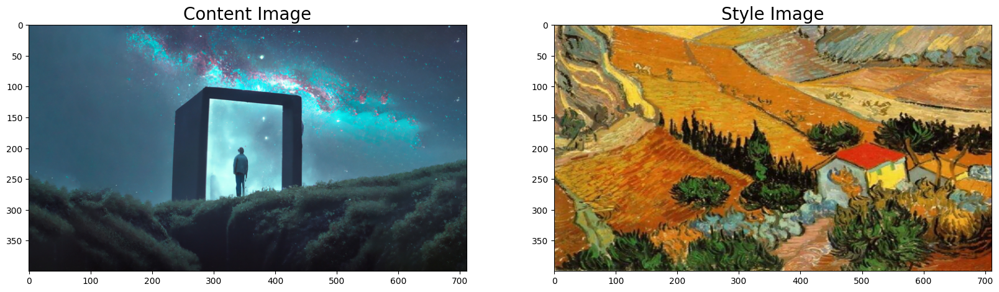

In [122]:
# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
# content and style ims side-by-side
ax1.imshow(im_convert(content))
ax1.set_title("Content Image",fontsize = 20)
ax2.imshow(im_convert(style))
ax2.set_title("Style Image", fontsize = 20)
plt.show()

In [123]:
def get_features(image, model, layers=None):
    """ Run an image forward through a model and get the features for 
        a set of layers. Default layers are for VGGNet matching Gatys et al (2016)
    """
    
    ## TODO: Complete mapping layer names of PyTorch's VGGNet to names from the paper
    ## Need the layers for the content and style representations of an image
    if layers is None:
        layers = {'0': 'conv1_1',
                  '5': 'conv2_1', 
                  '10': 'conv3_1', 
                  '19': 'conv4_1',
                  '21': 'conv4_2',  ## content representation
                  '28': 'conv5_1'}
        
    features = {}
    x = image
    # model._modules is a dictionary holding each module in the model
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x
            
    return features
def gram_matrix(tensor):
    """ Calculate the Gram Matrix of a given tensor 
        Gram Matrix: https://en.wikipedia.org/wiki/Gramian_matrix
    """
    
    # get the batch_size, depth, height, and width of the Tensor
    _, d, h, w = tensor.size()
    
    # reshape so we're multiplying the features for each channel
    tensor = tensor.view(d, h * w)
    
    # calculate the gram matrix
    gram = torch.mm(tensor, tensor.t())
    
    return gram 

In [124]:
# get content and style features only once before training
content_features = get_features(content, vgg)
style_features = get_features(style, vgg)

# calculate the gram matrices for each layer of our style representation
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

# create a third "target" image and prep it for change
# it is a good idea to start of with the target as a copy of our *content* image
# then iteratively change its style
target = content.clone().requires_grad_(True).to(device)

In [125]:
# weights for each style layer 
# weighting earlier layers more will result in *larger* style artifacts
# notice we are excluding `conv4_2` our content representation
style_weights = {'conv1_1': 1.,
                 'conv2_1': 0.75,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}

content_weight = 1  # alpha
style_weight = 1e9  # beta

Total loss:  1175511936.0


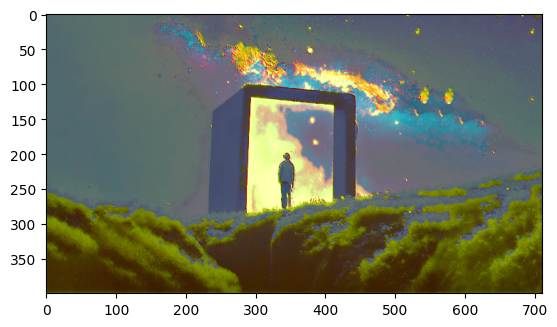

Total loss:  106786336.0


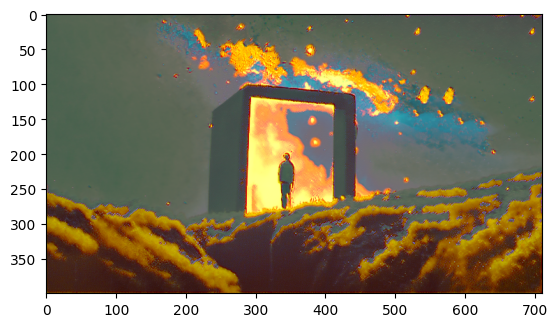

Total loss:  18673444.0


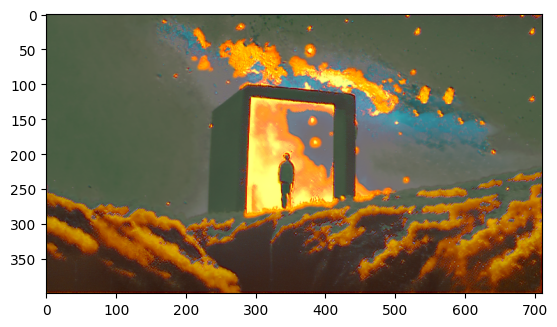

Total loss:  7481751.5


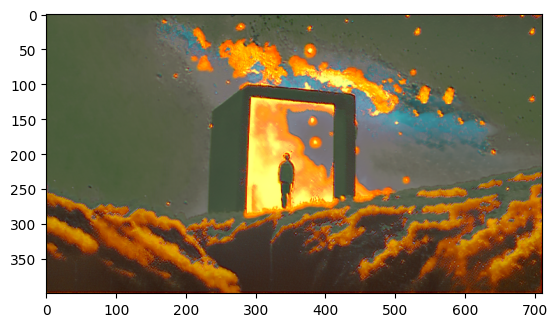

Total loss:  4189847.0


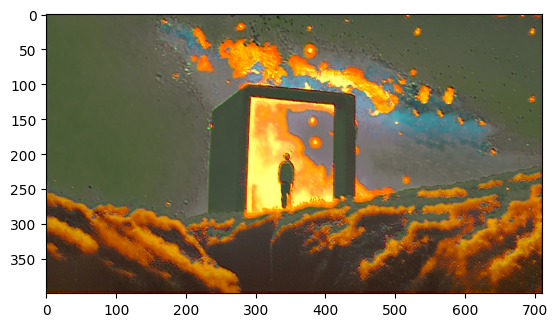

In [126]:
# for displaying the target image, intermittently
show_every = 400

# iteration hyperparameters
optimizer = optim.Adam([target], lr=0.003)
steps = 2000  # decide how many iterations to update your image (5000)

for ii in range(1, steps+1):
    
    # get the features from your target image
    target_features = get_features(target, vgg)
    
    # the content loss
    content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)
    
    # the style loss
    # initialize the style loss to 0
    style_loss = 0
    # then add to it for each layer's gram matrix loss
    for layer in style_weights:
        # get the "target" style representation for the layer
        target_feature = target_features[layer]
        target_gram = gram_matrix(target_feature)
        _, d, h, w = target_feature.shape
        # get the "style" style representation
        style_gram = style_grams[layer]
        # the style loss for one layer, weighted appropriately
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        # add to the style loss
        style_loss += layer_style_loss / (d * h * w)
        
    # calculate the *total* loss
    total_loss = content_weight * content_loss + style_weight * style_loss
    
    # update your target image
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
    
    # display intermediate images and print the loss
    if  ii % show_every == 0:
        print('Total loss: ', total_loss.item())
        plt.imshow(im_convert(target))
        plt.show()

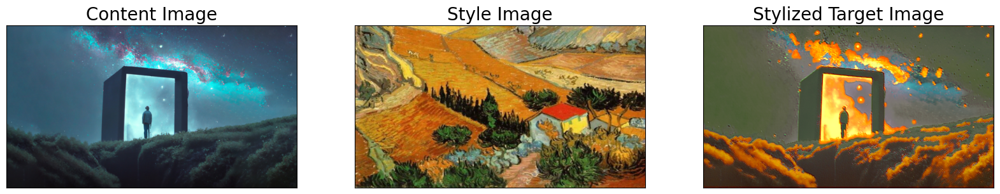

In [127]:
# display content, style, and stylized images side by side
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 20))

ax1.imshow(im_convert(content))
ax1.set_title("Content Image", fontsize=20)

ax2.imshow(im_convert(style))
ax2.set_title("Style Image", fontsize=20)

ax3.imshow(im_convert(target))
ax3.set_title("Stylized Target Image", fontsize=20)

# Hide axes ticks and grid
for ax in [ax1, ax2, ax3]:
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()


In [128]:
# Save the stylized image
stylized_image = im_convert(target)
plt.imsave('/kaggle/working/stylized_image.png', stylized_image)

## calculate SSIM value
SSIM stands for Structural Similarity Index, and it is a metric used to quantify the similarity between two images. It assesses the visual quality of the images by comparing their structural information, including luminance, contrast, and structure.

The SSIM index produces a value between -1 and 1, where:

1 indicates that the images are identical.
0 indicates no similarity.
-1 indicates complete dissimilarity.

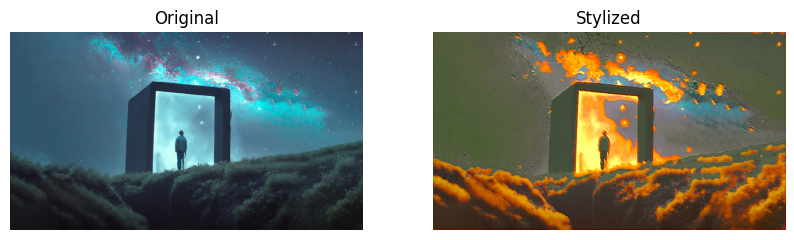

SSIM: 0.5147014758890089


In [129]:
from PIL import Image
import numpy as np
from skimage.metrics import structural_similarity as ssim
import matplotlib.pyplot as plt

def calculate_ssim(original, stylized):
    # Convert images to grayscale as SSIM is typically used for grayscale images
    original_gray = np.array(original.convert('L'))
    stylized_gray = np.array(stylized.convert('L'))
    
    # Ensure the images have the same shape
    min_shape = min(original_gray.shape, stylized_gray.shape)
    original_gray = original_gray[:min_shape[0], :min_shape[1]]
    stylized_gray = stylized_gray[:min_shape[0], :min_shape[1]]

    # Calculate SSIM
    ssim_value = ssim(original_gray, stylized_gray)

    return ssim_value

def display_images(original, stylized, title1='Original', title2='Stylized'):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    
    axes[0].imshow(original)
    axes[0].set_title(title1)
    axes[0].axis('off')
    
    axes[1].imshow(stylized)
    axes[1].set_title(title2)
    axes[1].axis('off')
    
    plt.show()

# Assuming you have 'original_image.jpg' and 'stylized_image.jpg'
original_image_path = base_image_path
stylized_image_path = '/kaggle/working/stylized_image.png'

# Load images
original_image = Image.open(original_image_path)
stylized_image = Image.open(stylized_image_path)

# Display images
display_images(original_image, stylized_image)

# Calculate SSIM
ssim_value = calculate_ssim(original_image, stylized_image)
print(f'SSIM: {ssim_value}')


LOWER VALUE OF SSIM MEANS THE ORIGINAL IMAGE MAINTAINS ITS STRUCTUAL INTEGRITY WHILE ALSO STYLE TRANSFERING

## EXAMPLE 2 FOR STYLE TRANSFER

In [145]:
import random
import os

artist = 'Vincent_van_Gogh'
random_image1 = random.choice(os.listdir(os.path.join(images_dir, artist)))
random_image_file1 = os.path.join(images_dir, artist, random_image1)

# Select a random artist other than Vincent_van_Gogh
random_artist2 = artist
while random_artist2 == artist:
    random_artist2 = random.choice(artists_top_name)
random_image2 = random.choice(os.listdir(os.path.join(images_dir, random_artist2)))
random_image_file2 = os.path.join(images_dir, random_artist2, random_image2)

base_image_path ='/kaggle/input/justimgg/f85b0d7ce19ecfe40a03132dba9a758df0cb8de7d8544058bc4fcaa8c24637a1.jpg'
style_image_path = random_image_file1

In [146]:
# load in content and style image
content = load_image(base_image_path).to(device)
# Resize style to match content, makes code easier
style = load_image(style_image_path, shape=content.shape[-2:]).to(device)

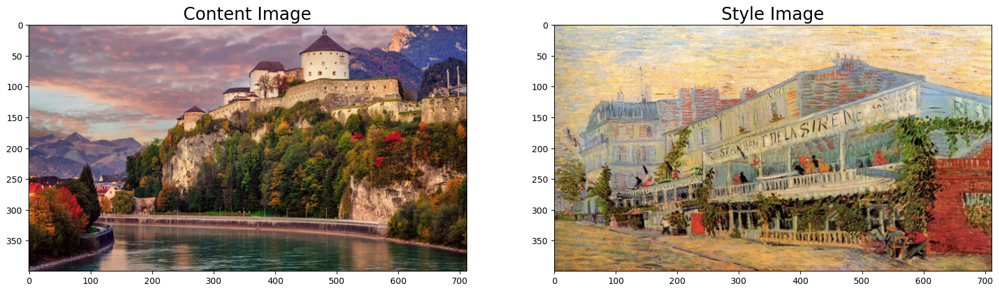

In [147]:
# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
# content and style ims side-by-side
ax1.imshow(im_convert(content))
ax1.set_title("Content Image",fontsize = 20)
ax2.imshow(im_convert(style))
ax2.set_title("Style Image", fontsize = 20)
plt.show()

In [148]:
# get content and style features only once before training
content_features = get_features(content, vgg)
style_features = get_features(style, vgg)

# calculate the gram matrices for each layer of our style representation
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

# create a third "target" image and prep it for change
# it is a good idea to start of with the target as a copy of our *content* image
# then iteratively change its style
target = content.clone().requires_grad_(True).to(device)

In [149]:
# weights for each style layer 
# weighting earlier layers more will result in *larger* style artifacts
# notice we are excluding `conv4_2` our content representation
style_weights = {'conv1_1': 1.,
                 'conv2_1': 0.75,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}

content_weight = 1  # alpha
style_weight = 1e9  # beta

Total loss:  17468146.0


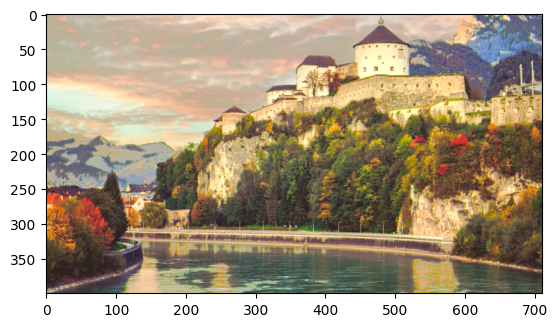

Total loss:  2583450.5


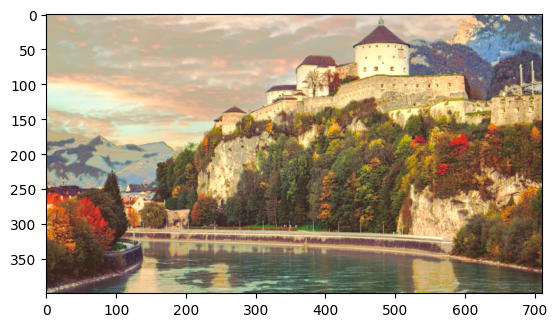

Total loss:  1262530.625


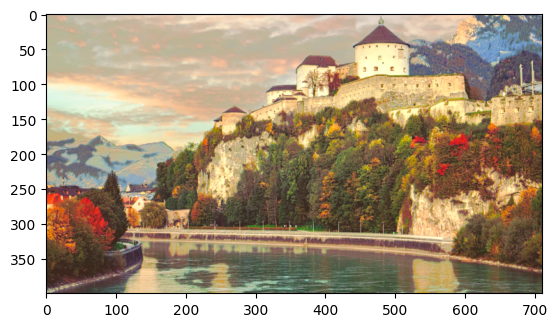

Total loss:  786646.5625


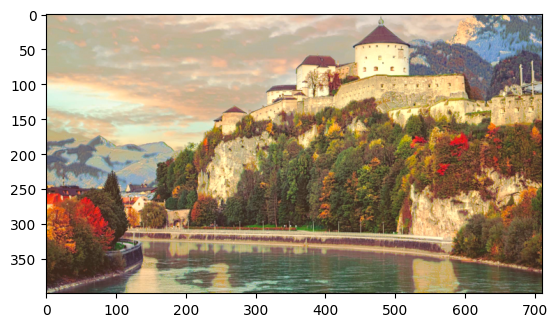

Total loss:  522867.5


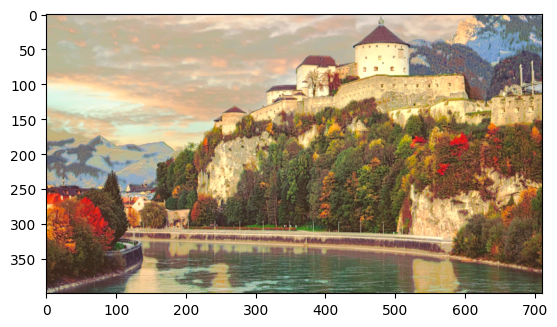

In [150]:
# for displaying the target image, intermittently
show_every = 400

# iteration hyperparameters
optimizer = optim.Adam([target], lr=0.003)
steps = 2000  # decide how many iterations to update your image (5000)

for ii in range(1, steps+1):
    
    # get the features from your target image
    target_features = get_features(target, vgg)
    
    # the content loss
    content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)
    
    # the style loss
    # initialize the style loss to 0
    style_loss = 0
    # then add to it for each layer's gram matrix loss
    for layer in style_weights:
        # get the "target" style representation for the layer
        target_feature = target_features[layer]
        target_gram = gram_matrix(target_feature)
        _, d, h, w = target_feature.shape
        # get the "style" style representation
        style_gram = style_grams[layer]
        # the style loss for one layer, weighted appropriately
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        # add to the style loss
        style_loss += layer_style_loss / (d * h * w)
        
    # calculate the *total* loss
    total_loss = content_weight * content_loss + style_weight * style_loss
    
    # update your target image
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
    
    # display intermediate images and print the loss
    if  ii % show_every == 0:
        print('Total loss: ', total_loss.item())
        plt.imshow(im_convert(target))
        plt.show()

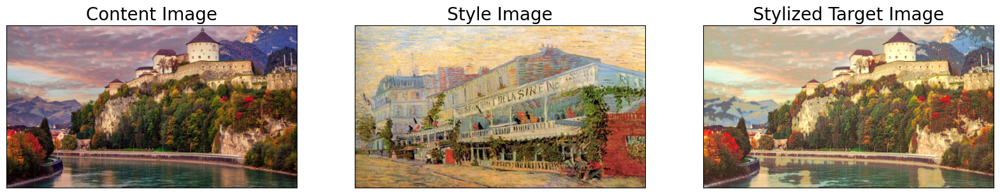

In [151]:
# display content, style, and stylized images side by side
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 20))

ax1.imshow(im_convert(content))
ax1.set_title("Content Image", fontsize=20)

ax2.imshow(im_convert(style))
ax2.set_title("Style Image", fontsize=20)

ax3.imshow(im_convert(target))
ax3.set_title("Stylized Target Image", fontsize=20)

# Hide axes ticks and grid
for ax in [ax1, ax2, ax3]:
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()


In [152]:
# Save the stylized image
stylized_image = im_convert(target)
plt.imsave('/kaggle/working/stylized_image.png', stylized_image)

## calculate SSIM value


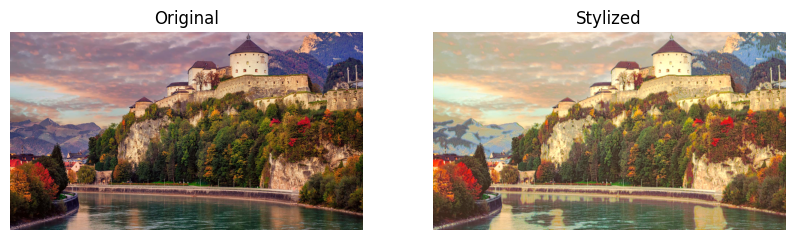

SSIM: 0.29912375993551704


In [153]:
from PIL import Image
import numpy as np
from skimage.metrics import structural_similarity as ssim
import matplotlib.pyplot as plt

def calculate_ssim(original, stylized):
    # Convert images to grayscale as SSIM is typically used for grayscale images
    original_gray = np.array(original.convert('L'))
    stylized_gray = np.array(stylized.convert('L'))
    
    # Ensure the images have the same shape
    min_shape = min(original_gray.shape, stylized_gray.shape)
    original_gray = original_gray[:min_shape[0], :min_shape[1]]
    stylized_gray = stylized_gray[:min_shape[0], :min_shape[1]]

    # Calculate SSIM
    ssim_value = ssim(original_gray, stylized_gray)

    return ssim_value

def display_images(original, stylized, title1='Original', title2='Stylized'):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    
    axes[0].imshow(original)
    axes[0].set_title(title1)
    axes[0].axis('off')
    
    axes[1].imshow(stylized)
    axes[1].set_title(title2)
    axes[1].axis('off')
    
    plt.show()

# Assuming you have 'original_image.jpg' and 'stylized_image.jpg'
original_image_path = base_image_path
stylized_image_path = '/kaggle/working/stylized_image.png'

# Load images
original_image = Image.open(original_image_path)
stylized_image = Image.open(stylized_image_path)

# Display images
display_images(original_image, stylized_image)

# Calculate SSIM
ssim_value = calculate_ssim(original_image, stylized_image)
print(f'SSIM: {ssim_value}')


## EXAMPLE 3 FOR STYLE TRANSFER


In [154]:
import random
import os

artist = 'Vincent_van_Gogh'
random_image1 = random.choice(os.listdir(os.path.join(images_dir, artist)))
random_image_file1 = os.path.join(images_dir, artist, random_image1)

# Select a random artist other than Vincent_van_Gogh
random_artist2 = artist
while random_artist2 == artist:
    random_artist2 = random.choice(artists_top_name)
random_image2 = random.choice(os.listdir(os.path.join(images_dir, random_artist2)))
random_image_file2 = os.path.join(images_dir, random_artist2, random_image2)

base_image_path ='/kaggle/input/justimgg/We Had to Look Twice to Understand These Tricky Photos.jpg'
style_image_path = random_image_file1

# load in content and style image
content = load_image(base_image_path).to(device)
# Resize style to match content, makes code easier
style = load_image(style_image_path, shape=content.shape[-2:]).to(device)

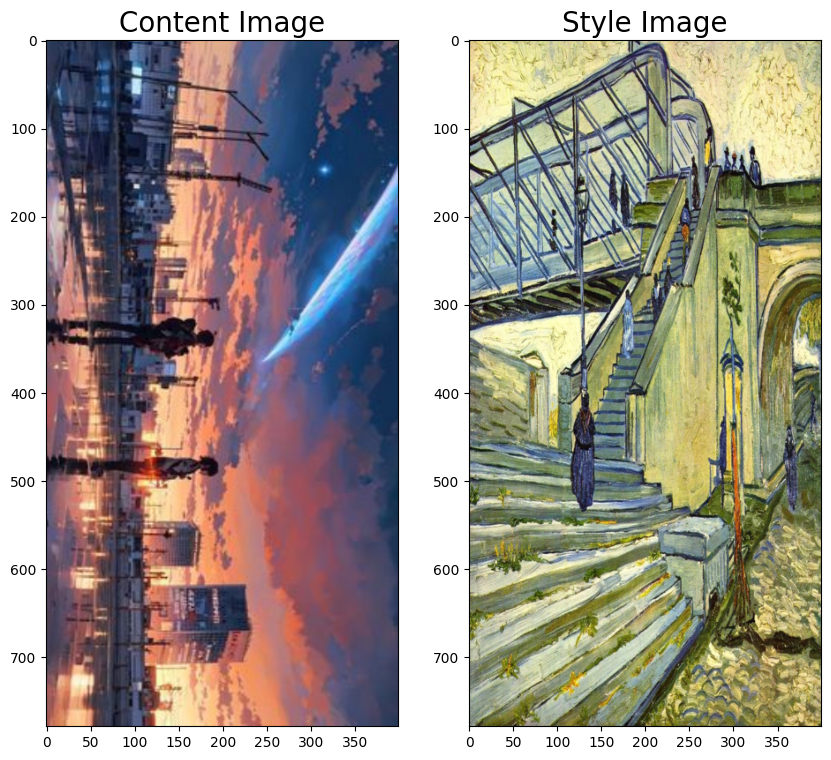

In [160]:
# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 10))
# content and style ims side-by-side
ax1.imshow(im_convert(content))
ax1.set_title("Content Image",fontsize = 20)
ax2.imshow(im_convert(style))
ax2.set_title("Style Image", fontsize = 20)
plt.show()

In [162]:
# get content and style features only once before training
content_features = get_features(content, vgg)
style_features = get_features(style, vgg)

# calculate the gram matrices for each layer of our style representation
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

# create a third "target" image and prep it for change
# it is a good idea to start of with the target as a copy of our *content* image
# then iteratively change its style
target = content.clone().requires_grad_(True).to(device)
# weights for each style layer 
# weighting earlier layers more will result in *larger* style artifacts
# notice we are excluding `conv4_2` our content representation
style_weights = {'conv1_1': 1.,
                 'conv2_1': 0.75,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}

content_weight = 1  # alpha
style_weight = 1e9  # beta

Total loss:  109819568.0


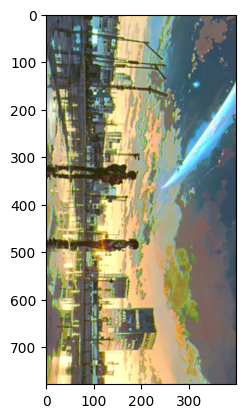

Total loss:  12587983.0


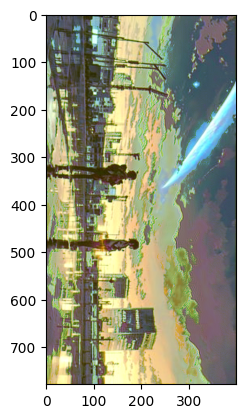

Total loss:  4722719.0


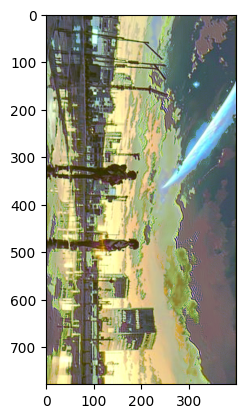

Total loss:  2111513.0


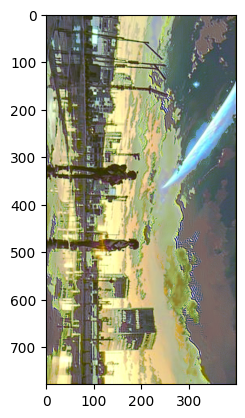

Total loss:  1072546.0


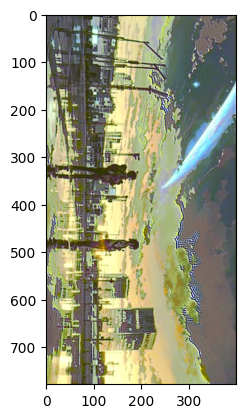

In [163]:
# for displaying the target image, intermittently
show_every = 400

# iteration hyperparameters
optimizer = optim.Adam([target], lr=0.003)
steps = 2000  # decide how many iterations to update your image (5000)

for ii in range(1, steps+1):
    
    # get the features from your target image
    target_features = get_features(target, vgg)
    
    # the content loss
    content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)
    
    # the style loss
    # initialize the style loss to 0
    style_loss = 0
    # then add to it for each layer's gram matrix loss
    for layer in style_weights:
        # get the "target" style representation for the layer
        target_feature = target_features[layer]
        target_gram = gram_matrix(target_feature)
        _, d, h, w = target_feature.shape
        # get the "style" style representation
        style_gram = style_grams[layer]
        # the style loss for one layer, weighted appropriately
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        # add to the style loss
        style_loss += layer_style_loss / (d * h * w)
        
    # calculate the *total* loss
    total_loss = content_weight * content_loss + style_weight * style_loss
    
    # update your target image
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
    
    # display intermediate images and print the loss
    if  ii % show_every == 0:
        print('Total loss: ', total_loss.item())
        plt.imshow(im_convert(target))
        plt.show()

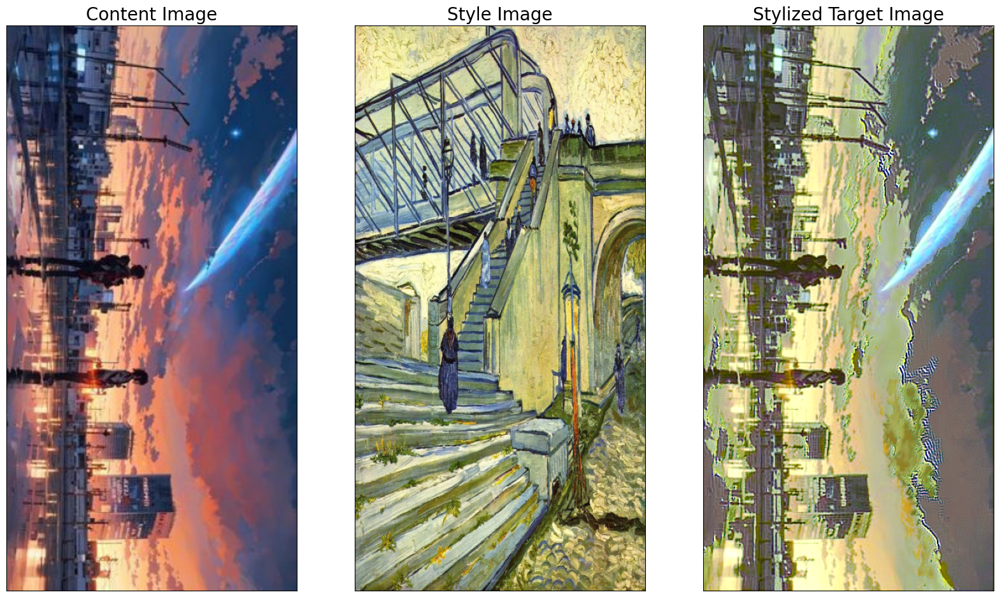

In [164]:
# display content, style, and stylized images side by side
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 20))

ax1.imshow(im_convert(content))
ax1.set_title("Content Image", fontsize=20)

ax2.imshow(im_convert(style))
ax2.set_title("Style Image", fontsize=20)

ax3.imshow(im_convert(target))
ax3.set_title("Stylized Target Image", fontsize=20)

# Hide axes ticks and grid
for ax in [ax1, ax2, ax3]:
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()


In [166]:
# Save the stylized image
stylized_image = im_convert(target)
plt.imsave('/kaggle/working/stylized_image.png', stylized_image)

## calculate SSIM



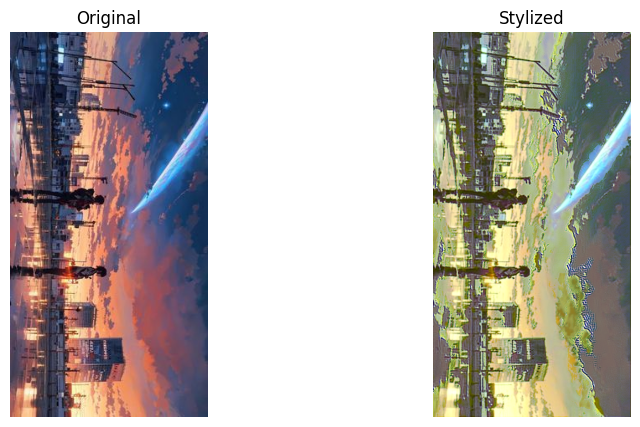

SSIM: 0.09970433903725284


In [167]:
from PIL import Image
import numpy as np
from skimage.metrics import structural_similarity as ssim
import matplotlib.pyplot as plt

def calculate_ssim(original, stylized):
    # Convert images to grayscale as SSIM is typically used for grayscale images
    original_gray = np.array(original.convert('L'))
    stylized_gray = np.array(stylized.convert('L'))
    
    # Ensure the images have the same shape
    min_shape = min(original_gray.shape, stylized_gray.shape)
    original_gray = original_gray[:min_shape[0], :min_shape[1]]
    stylized_gray = stylized_gray[:min_shape[0], :min_shape[1]]

    # Calculate SSIM
    ssim_value = ssim(original_gray, stylized_gray)

    return ssim_value

def display_images(original, stylized, title1='Original', title2='Stylized'):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    
    axes[0].imshow(original)
    axes[0].set_title(title1)
    axes[0].axis('off')
    
    axes[1].imshow(stylized)
    axes[1].set_title(title2)
    axes[1].axis('off')
    
    plt.show()

# Assuming you have 'original_image.jpg' and 'stylized_image.jpg'
original_image_path = base_image_path
stylized_image_path = '/kaggle/working/stylized_image.png'

# Load images
original_image = Image.open(original_image_path)
stylized_image = Image.open(stylized_image_path)

# Display images
display_images(original_image, stylized_image)

# Calculate SSIM
ssim_value = calculate_ssim(original_image, stylized_image)
print(f'SSIM: {ssim_value}')
